## Модель предсказывающая коэффициент восстановления золота из золотосодержащей руды.

Из исторических данных с параметрами добычи и очистки построить модель предсказывающая коэффициент восстановления золота из золотосодержащей руды. Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Целевая метрика *sMAPE*.

## Структура проекта:
[1. Подготовка данных](1)   
[1.1 Загрузка данных и предварительное изучение](1.1)  
[1.2 Проверка расчета эффективность обогащения](1.2)  
[1.3 Признаки, недоступные в тестовой выборке](1.3)  
[1.4 Предобработка данных](1.4)  
[2. Анализ данных](2)  
[2.1 Изменение концентрации металлов (Au, Ag, Pb)](2.1)  
[2.2 Сравнение размеров гранул сырья на обучающей и тестовой выборках](2.2)  
[2.3 Исследование концентрацию веществ на разных стадиях](2.3)  
[2.4 Прочие исследования](2.4)  
[3. Модель](3)  
[3.1 Функция для вычисления итоговой sMAPE](3.1)  
[3.2. Обучение и выбор лучшей модели](3.2)  
[Итоговый вывод](4)


# Импорт модулей

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.metrics import mean_absolute_error
from scipy import stats as st
from scipy.stats import mannwhitneyu
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler
pd.set_option('display.max_columns', None) 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
!pip install scikit-learn --upgrade

Defaulting to user installation because normal site-packages is not writeable
Requirement already up-to-date: scikit-learn in /home/jovyan/.local/lib/python3.7/site-packages (0.24.0)


# <a name="1">1. Подготовка данных</a>

## <a name="1.1">1.1. Загрузка данных и предварительное изучение</a>

In [2]:
train = pd.read_csv('/datasets/gold_recovery_train.csv')
test = pd.read_csv('/datasets/gold_recovery_test.csv')
full = pd.read_csv('/datasets/gold_recovery_full.csv')

In [3]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
date                                          5856 non-null object
primary_cleaner.input.sulfate                 5554 non-null float64
primary_cleaner.input.depressant              5572 non-null float64
primary_cleaner.input.feed_size               5856 non-null float64
primary_cleaner.input.xanthate                5690 non-null float64
primary_cleaner.state.floatbank8_a_air        5840 non-null float64
primary_cleaner.state.floatbank8_a_level      5840 non-null float64
primary_cleaner.state.floatbank8_b_air        5840 non-null float64
primary_cleaner.state.floatbank8_b_level      5840 non-null float64
primary_cleaner.state.floatbank8_c_air        5840 non-null float64
primary_cleaner.state.floatbank8_c_level      5840 non-null float64
primary_cleaner.state.floatbank8_d_air        5840 non-null float64
primary_cleaner.state.floatbank8_d_level      5840 non-null float64
rougher.in

тестовая выборка:
- 53 колонки и 5 855 строк;
- формат float64 почти во всех столбцах;
- столбец date имеет формат object, его нужно будет перевести в формат даты
- имееются пропуски, на взгляд не более 5-6%

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
date                                                  16860 non-null object
final.output.concentrate_ag                           16788 non-null float64
final.output.concentrate_pb                           16788 non-null float64
final.output.concentrate_sol                          16490 non-null float64
final.output.concentrate_au                           16789 non-null float64
final.output.recovery                                 15339 non-null float64
final.output.tail_ag                                  16794 non-null float64
final.output.tail_pb                                  16677 non-null float64
final.output.tail_sol                                 16715 non-null float64
final.output.tail_au                                  16794 non-null float64
primary_cleaner.input.sulfate                         15553 non-null float64
primary_cleaner.input.depressant             

обучающая выборка:
- 87 колонок и 16 860 строк;
- формат float64 почти во всех столбцах;
- столбец date имеет формат object, его нужно будет перевести в формат даты
- имееются пропуски, в основном незначительные не более 5%, НО есть столбцы с пропусками достигающие 15%.

In [5]:
train.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,10.128295,7.25,0.988759,8.547551,10.389648,19.529297,34.174427,14.936526,2.534912,7.476074,2.106679,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,41885.707031,3481.779053,3520.337158,2.838687,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,11.500771,7.101074,28.029297,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,14.500184,4.694824,8.764648,2.606185,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,10.296251,7.25,1.002663,8.558743,10.

In [6]:
train.describe()

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,16788.000000,16788.000000,16490.000000,16789.000000,15339.000000,16794.000000,16677.000000,16715.000000,16794.000000,15553.000000,15598.000000,16860.000000,15875.000000,16778.000000,16502.000000,16224.000000,16778.000000,16777.000000,16761.000000,16579.000000,16777.000000,16820.000000,16827.000000,16820.000000,16833.000000,16822.000000,16833.000000,16821.000000,16833.000000,1.683300e+04,1.683300e+04,1.683300e+04,15618.000000,16778.000000,16632.000000,16347.000000,16443.000000,16568.000000,16777.000000,15816.000000,16514.000000,16237.000000,14956.000000,16778.000000,16778.000000,16698.000000,16778.000000,14287.000000,14610.000000,16778.000000,14611.000000,14611.000000,16807.000000,16807.000000,16807.000000,16807.000000,16807.000000,16814.000000,16802.000000,16809.000000,16257.000000,16809.000000,16802.000000,16802.000000,16776.000000,16764.000000,14874.000000,16778.000000,16497.000000,16751.000000,16705.000000,16748.000000,16763.000000,16747.000000,16752.000000,16750.000000,16731.000000,16747.000000,16768.000000,16767.000000,16775.000000,16775.000000,16775

- есть столбцы имеющие отрицательные значения, возможно это и правильно

## <a name="1.2">1.2 Проверка расчета эффективность обогащения.</a>

- Проверьте, что эффективность обогащения рассчитана правильно. Вычислите её на обучающей выборке для признака rougher.output.recovery. Найдите MAE между вашими расчётами и значением признака. Опишите выводы.

In [7]:
train1 = train.dropna(subset = ['rougher.output.concentrate_au', 'rougher.input.feed_au', 
                                 'rougher.output.tail_au', 'rougher.output.recovery'])

- создам дубликат датафрейма train, для расчета MAE.
- в дубликате удаляем пропуски, так как с ними выдаётся ошибка, да и расчеты будет не очень верны.

In [8]:
def recovery(c, f, t):
    recovery = ((c * (f-t)) / (f * (c-t))) * 100
    return recovery


c = train1['rougher.output.concentrate_au']
f = train1['rougher.input.feed_au']
t = train1['rougher.output.tail_au']
result = train1['rougher.output.recovery']

rougher_recovery = recovery(c, f, t)


In [9]:
mae = mean_absolute_error(result, rougher_recovery)
print('MAE равен {:.15f}'.format(mae))

MAE равен 0.000000000000009


- Среднее абсолютная ошибка практически сведена к нулю. Что говорит о точности расчета.

## <a name="1.3">1.3. Признаки, недоступные в тестовой выборке.</a>

- Проанализируйте признаки, недоступные в тестовой выборке. Что это за параметры? К какому типу относятся?

In [10]:
tr_col = train.columns

In [11]:
len(tr_col)

87

In [12]:
ts_col = test.columns

In [13]:
len(ts_col)

53

In [14]:
tr_col[~tr_col.isin(ts_col)]

Index(['final.output.concentrate_ag', 'final.output.concentrate_pb',
       'final.output.concentrate_sol', 'final.output.concentrate_au',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb',
       'final.output.tail_sol', 'final.output.tail_au',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb',
       'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au',
       'rougher.calculation.sulfate_to_au_concentrate',
       'rougher.calculation.floatbank10_sulfate_to_au_feed',
       'rougher.calculation.floatbank11_sulfate_to_au_feed',
       'rougher.calculation.au_pb_ratio', 'rougher.output.concentrate_ag',
       'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol',
       'rougher.output.concentrate_au', 'rougher.outpu

In [15]:
t_col = ['final.output.concentrate_ag', 'final.output.concentrate_pb',
       'final.output.concentrate_sol', 'final.output.concentrate_au',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb',
       'final.output.tail_sol', 'final.output.tail_au',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb',
       'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au',
       'rougher.calculation.sulfate_to_au_concentrate',
       'rougher.calculation.floatbank10_sulfate_to_au_feed',
       'rougher.calculation.floatbank11_sulfate_to_au_feed',
       'rougher.calculation.au_pb_ratio', 'rougher.output.concentrate_ag',
       'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol',
       'rougher.output.concentrate_au', 'rougher.output.recovery',
       'rougher.output.tail_ag', 'rougher.output.tail_pb',
       'rougher.output.tail_sol', 'rougher.output.tail_au',
       'secondary_cleaner.output.tail_ag', 'secondary_cleaner.output.tail_pb',
       'secondary_cleaner.output.tail_sol',
       'secondary_cleaner.output.tail_au']

Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже.   
Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей.  
Также в тестовом наборе нет целевых признаков.

In [16]:
len(tr_col[~tr_col.isin(ts_col)])

34

34 признака нет в тестовой выборке:  
- признаки калькуляции на уровне флотации;
- признаки параметров металлов вышедших из флотации на первичный этап обработки;
- признаки параметров металлов вышедших из флотации в отвальные хвосты;
- признак эффективности обогащения;
- признаки параметров металлов вышедших из первичной обработки во вторичный этап обработки и в отвальные хвосты;
- признаки параметров металлов вышедших из вторичной обработки в отвальные хвосты; (во втором этапе обработки параметры выходного металла не замеряются);
- признаки параметров металлов вышедших из финальной обработки и в отвальные хвосты;  

Тип данных float.


## <a name="1.4">1.4. Предобработка данных.</a>

### Преобразование формата данных

In [17]:
train.date = pd.to_datetime(train.date, format='%Y-%m-%d %H:%M:%S')
train.date = pd.to_datetime(train.date).astype(np.int64) // 10**9
test.date = pd.to_datetime(test.date, format='%Y-%m-%d %H:%M:%S')
test.date = pd.to_datetime(test.date).astype(np.int64) // 10**9
full.date = pd.to_datetime(full.date, format='%Y-%m-%d %H:%M:%S')
full.date = pd.to_datetime(full.date).astype(np.int64) // 10**9

- Перевод даты в Unix для тестовой и обучающей выборки и в формат даты для полного датафрейма(для наглядности)

### Подготовка тестовой выборки с целевыми признаками

склеивание тестовой выборки и целевых признаков

In [18]:
test = test.merge(full[['date', 'rougher.output.recovery', 'final.output.recovery']], how = 'left', on = 'date')

### Работа с пропусками

- удалю пропуски и нули в целевых значениях, для всего остального использую Impute

In [19]:
train = train[train['final.output.recovery'].notna()]
train = train[(train['rougher.output.recovery'] != 0) & (train['final.output.recovery'] != 0)]

In [20]:
test = test[(test['rougher.output.recovery'] != 0) & (test['final.output.recovery'] != 0)]
test = test[(test['rougher.output.recovery'].notna()) & (test['final.output.recovery'].notna())]

In [21]:
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(train)
IterativeImputer(random_state=0)
tr = imp.transform(train)

In [22]:
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(test)
IterativeImputer(random_state=0)
ts = imp.transform(test)

In [23]:
train = pd.DataFrame(data = tr, columns = full.columns)
test = pd.DataFrame(data = ts, columns = test.columns)

# <a name="2">2. Анализ данных</a>

## <a name="2.1">2.1 Изменение концентрации металлов (Au, Ag, Pb)</a>

- Посмотрите, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. Опишите выводы.

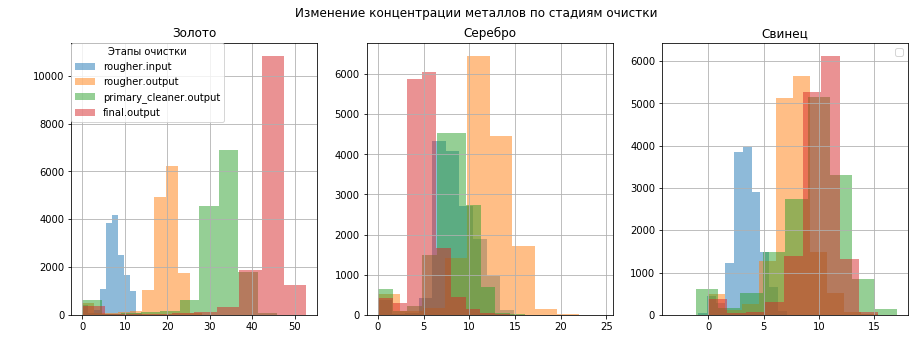

In [24]:
fig, (ax1, ax2, ax3) = plt.subplots(
    nrows=1, ncols=3, figsize = (15,5))
plt.suptitle("Изменение концентрации металлов по стадиям очистки")
plt.legend('rougher.input')
ax1.set_title('Золото')
train['rougher.input.feed_au'].hist(ax=ax1, alpha = 0.5, label='rougher.input')
train['rougher.output.concentrate_au'].hist(ax=ax1, alpha = 0.5, label='rougher.input')
train['primary_cleaner.output.concentrate_au'].hist(ax=ax1, alpha = 0.5, label='rougher.input')
train['final.output.concentrate_au'].hist(ax=ax1, alpha = 0.5, label='rougher.input')
labels= ["rougher.input","rougher.output", "primary_cleaner.output", "final.output"]
plt.legend(labels)

ax2.set_title('Серебро')
train['rougher.input.feed_ag'].hist(ax=ax2, alpha = 0.5)
train['rougher.output.concentrate_ag'].hist(ax=ax2, alpha = 0.5)
train['primary_cleaner.output.concentrate_ag'].hist(ax=ax2, alpha = 0.5)
train['final.output.concentrate_ag'].hist(ax=ax2, alpha = 0.5)

ax3.set_title('Свинец')
train['rougher.input.feed_pb'].hist(ax=ax3, alpha = 0.5)
train['rougher.output.concentrate_pb'].hist(ax=ax3, alpha = 0.5)
train['primary_cleaner.output.concentrate_pb'].hist(ax=ax3, alpha = 0.5)
train['final.output.concentrate_pb'].hist(ax=ax3, alpha = 0.5)

fig.legend(     # The line objects
           labels=labels,   # The labels for each line
#           loc="upper_left",   # Position of legend
           borderaxespad=0.1,    # Small spacing around legend box
           title="Этапы очистки",  # Title for the legend
           bbox_to_anchor=(0.2085, 0.825)
           )

видны выбросы в районе 0 по каждому металлу и этапу очистки. в п.2.3 - эти выбросы будут удалены.  

1. концентрация золота растёт на каждом этапе очистки.
2. концентрация свинца на первой и финальной очистке примерно одинаково.
3. концентрация серебра идёт обратным ходом, сначала на этапе флотации растёт, затем падает на первой и финальной очистке.

## <a name="2.2">2.2 Сравнение размеров гранул сырья на обучающей и тестовой выборках</a>

- Сравните распределения размеров гранул сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.

### Распределение гранул сырья на флотации

In [25]:
x0 = train['rougher.input.feed_size']
x1 = test['rougher.input.feed_size']


fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=x0, name='Обучающая выборка',
                marker_color = 'rgb(136,204,238)'))
fig.add_trace(go.Box(x=x1, name='Тестовая выборка',
                marker_color = 'rgb(133,92,117)'))


fig.update_layout(
    title="Распределение размеров гранул сырья на обучающей и тестовой выборках (флотация)",
    xaxis_title="Размеры гранул",
    )

fig.show()

In [26]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=x0, histnorm='probability', name='Обучающая выборка',
                marker_color = 'rgb(136,204,238)'))
fig.add_trace(go.Histogram(x=x1, histnorm='probability', name='Тестовая выборка',
                marker_color = 'rgb(133,92,117)'))


# Overlay both histograms
fig.update_layout(barmode='overlay',
    title="Распределение размеров гранул сырья на обучающей и тестовой выборках (флотация)",
    xaxis_title="Размеры гранул",
    )   
                         
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

### Гипотеза о равенстве средних обучающей и тестовой выборки на флотации

- Нулевая гипотеза: Среднее распределение размеров гранул сырья в обеих выборках равны
- Альтернативная гипотеза: Среднее распределение размеров гранул сырья в обеих выборках отличаются

In [27]:
alpha = 0.05
result = st.ttest_ind(train['rougher.input.feed_size'], test['rougher.input.feed_size'])
mean_difference = train['rougher.input.feed_size'].mean() - test['rougher.input.feed_size'].mean()
print("Разность средних значений:", mean_difference)

print('p-значение: {:.24f}'.format(result.pvalue))

if result.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

Разность средних значений: 3.4801738277128607
p-значение: 0.000000000000000000000029
Отвергаем нулевую гипотезу


- распределение гранул в двух выборках не равно. Не знаю как исправить. Если убирать аномалные значения, расхождения еще выше. Даже если и выровнить на этом этапе. В п.2.3 мы снова срезаем аномальные значения, и выборки снова не будут равны.
Оставляю как есть.

### U-тест Манна-Уитни

In [29]:
alpha = 0.05
stat, p = mannwhitneyu(train['rougher.input.feed_size'], test['rougher.input.feed_size'])
print('Statistics=%.3f, p=%.24f' % (stat, p))

if p > alpha:
    print("Не в состоянии отклонить H0: Распределения выборки равны")
else:
    print("Отклонить H0: Распределения выборки не равны")

Statistics=31579764.000, p=0.000000000000000000000000
Отклонить H0: Распределения выборки не равны


### Распределение гранул сырья на первичной обработке

In [30]:
x0 = train['primary_cleaner.input.feed_size']
x1 = test['primary_cleaner.input.feed_size']


fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=x0, name='Обучающая выборка',
                marker_color = 'rgb(102,102,102)'))
fig.add_trace(go.Box(x=x1, name='Тестовая выборка',
                marker_color = 'rgb(115,111,76)'))


fig.update_layout(
    title="Распределение размеров гранул сырья на обучающей и тестовой выборках (первичная обработка)",
    xaxis_title="Размеры гранул",
    )

fig.show()

In [31]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=x0, histnorm='probability', name='Обучающая выборка',
                marker_color = 'rgb(102,102,102)'))
fig.add_trace(go.Histogram(x=x1, histnorm='probability', name='Тестовая выборка',
                marker_color = 'rgb(115,111,76)'))


# Overlay both histograms
fig.update_layout(barmode='overlay',
    title="Распределение размеров гранул сырья на обучающей и тестовой выборках (первичная обработка)",
    xaxis_title="Размеры гранул",
    )   
                         
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

### Гипотеза о равенстве средних обучающей и тестовой выборки на первичной обработке

- Нулевая гипотеза: Среднее распределение размеров гранул сырья в обеих выборках равны
- Альтернативная гипотеза: Среднее распределение размеров гранул сырья в обеих выборках отличаются

In [32]:
alpha = 0.05
result = st.ttest_ind(train['primary_cleaner.input.feed_size'], test['primary_cleaner.input.feed_size'])
print('p-значение: {:.24f}'.format(result.pvalue))

if result.pvalue < alpha:
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.000004045650482484722036
Отвергаем нулевую гипотезу


- распределение гранул в двух выборках не равно. Не знаю как исправить. Если убирать аномалные значения, расхождения еще выше. Даже если и выровнить на этом этапе. В п.2.3 мы снова срезаем аномальные значения, и выборки снова не будут равны.
Оставляю как есть.

### U-тест Манна-Уитни

In [33]:
from scipy.stats import mannwhitneyu
alpha = 0.05
stat, p = mannwhitneyu(train['primary_cleaner.input.feed_size'], test['primary_cleaner.input.feed_size'])
print('Statistics=%.3f, p=%.24f' % (stat, p))

if p > alpha:
    print("Не в состоянии отклонить H0: Распределения выборки равны")
else:
    print("Отклонить H0: Распределения выборки не равны")

Statistics=36596736.000, p=0.000000033791705621430497
Отклонить H0: Распределения выборки не равны


## <a name="2.3">2.3 Исследование концентрацию веществ на разных стадиях</a>

- Исследуйте суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. Заметили аномальные значения в суммарном распределении или нет? Если они есть, стоит ли их удалять из обеих выборок? Опишите выводы и удалите аномалии.

In [34]:
train['sum_rougher_input'] = train['rougher.input.feed_au'] + train['rougher.input.feed_ag'] + train['rougher.input.feed_pb'] + train['rougher.input.feed_sol']
test['sum_rougher_input'] = test['rougher.input.feed_au'] + test['rougher.input.feed_ag'] + test['rougher.input.feed_pb'] + test['rougher.input.feed_sol']
train['sum_rougher_output'] = train['rougher.output.concentrate_au'] + train['rougher.output.concentrate_ag'] + train['rougher.output.concentrate_pb'] + train['rougher.output.concentrate_sol']
train['sum_primary_cleaner'] = train['primary_cleaner.output.concentrate_au'] + train['primary_cleaner.output.concentrate_ag'] + train['primary_cleaner.output.concentrate_pb'] + train['primary_cleaner.output.concentrate_sol']
train['sum_final_output'] = train['final.output.concentrate_au'] + train['final.output.concentrate_ag'] + train['final.output.concentrate_pb'] + train['final.output.concentrate_sol']

In [35]:
x0 = train['sum_rougher_input']
x01 = test['sum_rougher_input']
x1 = train['sum_rougher_output']
x2 = train['sum_primary_cleaner']
x3 = train['sum_final_output']


fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=x0, name='До флотации обучающая',
                marker_color = 'rgb(102,102,102)'))
fig.add_trace(go.Box(x=x01, name='До флотации тест',
                marker_color = 'rgb(102,102,102)'))
fig.add_trace(go.Box(x=x1, name='После флотации',
                marker_color = 'rgb(115,111,76)'))
fig.add_trace(go.Box(x=x2, name='После 1 этапа очистки',
                marker_color = 'rgb(217,95,2)'))
fig.add_trace(go.Box(x=x3, name='После финальной очистки',
                marker_color = '#FECB52'))

fig.update_layout(
    title="Распределение суммарной концентрации вещест по стадиям очистки",
    xaxis_title="Суммарная концентрация веществ",
    )

fig.show()

In [36]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=x0, name='До флотации',
                marker_color = 'rgb(102,102,102)'))
fig.add_trace(go.Histogram(x=x1, name='После флотации',
                marker_color = 'rgb(115,111,76)'))
fig.add_trace(go.Histogram(x=x2, name='После 1 этапа очистки',
                marker_color = 'rgb(217,95,2)'))
fig.add_trace(go.Histogram(x=x3, name='После финальной очистки',
                marker_color = '#FECB52'))

# Overlay both histograms
fig.update_layout(barmode='overlay',
    title="Распределение суммарной концентрации вещест по стадиям очистки",
    xaxis_title="Суммарная концентрация веществ",
    )   
                         
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

- имеются аномальные значения, видно по графикам распределения. удалим аномальные значения.

### Удаление аномальных значений

- функция очистки датасета от выбросов более 3 стандартных отклонений

In [37]:
def er3(data):
    u = data.mean() + data.std()*3
    d = data.mean() - data.std()*3
    return data[(data > d) & (data < u)]

- функция очистки датасета от выбросов по усам диаграммы разброса

In [38]:
def fence(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    return data[(Q1 - 1.5*IQR < data) &  (data < Q3 + 1.5*IQR)]
#    outliers = data[(Q1 - 1.5*IQR >= data.BMI) |  (data.BMI >= Q3 + 1.5*IQR)]

In [39]:
train.shape

(14954, 91)

- удаление выбросов по 3 стандартным отклонениям

In [40]:
train = train[train.index.isin(er3(train['sum_rougher_input']).index)]
train = train[train.index.isin(er3(train['sum_rougher_output']).index)]
train = train[train.index.isin(er3(train['sum_primary_cleaner']).index)]
train = train[train.index.isin(er3(train['sum_final_output']).index)]
test = test.query('sum_rougher_input > 0')
train = train.drop(['sum_rougher_input', 'sum_rougher_output', 'sum_primary_cleaner', 'sum_final_output'], axis = 1)
test = test.drop(['sum_rougher_input'], axis = 1)

In [41]:
train.shape

(13702, 87)

## <a name="2.4">2.4 Прочие исследования</a>

- решил проанализировать выбросы на таргете

In [42]:
x0 = train['rougher.output.recovery']
x1 = test['rougher.output.recovery']
x2 = train['final.output.recovery']
x3 = test['final.output.recovery']


fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=x0, name='Rougher - Train',
                marker_color = 'rgb(102,102,102)'))
fig.add_trace(go.Box(x=x1, name='Rougher - Test',
                marker_color = 'rgb(115,111,76)'))
fig.add_trace(go.Box(x=x2, name='Final - Train',
                marker_color = 'rgb(217,95,2)'))
fig.add_trace(go.Box(x=x3, name='Final - Test',
                marker_color = '#FECB52'))

fig.update_layout(
    title="Эффективность обогащения на различных выборках",
    xaxis_title="Эффективность обогащения",
    )

fig.show()

In [43]:
train = train[train.index.isin(fence(train['rougher.output.recovery']).index)]
train = train[train.index.isin(fence(train['final.output.recovery']).index)]

- удалил выбросы по усам диаграммы размаха

In [44]:
train.shape

(12921, 87)

- я использовал 2 подхода, а не 1 в удаление выбросов так как: именно этот вариант экономит для обучения 1500 строк и даёт больше точности.

# <a name="3">3. Модель</a>

## <a name="3.1">3.1 Функция для вычисления итоговой sMAPE.</a>

- Напишите функцию для вычисления итоговой sMAPE.

In [45]:
def tsmape(target_rougher, predict_rougher, target_final, predict_final):
    smape_rougher = 1/len(target_rougher) * sum(2* abs(target_rougher - predict_rougher)/(abs(target_rougher) + abs(predict_rougher))) * 100
    smape_final = 1/len(target_final) * sum(2* abs(target_final - predict_final)/(abs(target_final) + abs(predict_final))) * 100
    tsmape = 0.25 * smape_rougher + 0.75 * smape_final
    return tsmape

In [46]:
def smape(target, predict):
    return 1/len(target) * sum(2* abs(target - predict)/(abs(target) + abs(predict))) * 100

In [47]:
my_smape = make_scorer(smape, greater_is_better = True)

#### Кривая обучаемости

- добавил свой вариант learning_curve

In [48]:
def learn_curve(modelname):
    _ = pd.Series(modelname.cv_results_)
    cv_res=pd.DataFrame({'test':_[['split0_test_score', 'split1_test_score', 
                        'split2_test_score', 'split3_test_score', 'split4_test_score']].values,
                'train':_[['split0_train_score', 'split1_train_score', 
                        'split2_train_score', 'split3_train_score', 'split4_train_score']].values})
    cv_res.index += 1
    _, ax = plt.subplots()
    ax.plot(cv_res['train'], label="Training score")
    ax.plot(cv_res['test'], label="Cross-validation score")
    ax.legend(loc="best")
    ax.set_xlabel("fit_times")
    ax.set_ylabel("Score")
    ax.set_title("Learning Curves")

## <a name="3.2">3.2. Обучение и выбор лучшей модели.</a>

- Обучите разные модели и оцените их качество кросс-валидацией. Выберите лучшую модель и проверьте её на тестовой выборке. Опишите выводы.

- подготовка обучающей и тестовой выборки для моделирования

In [49]:
features = train.drop(t_col, axis = 1)
target_r = train['rougher.output.recovery']
target_f = train['final.output.recovery']


features_test = test.drop(['rougher.output.recovery', 'final.output.recovery'], axis = 1)
target_test_r = test['rougher.output.recovery']
target_test_f = test['final.output.recovery']

In [50]:
scaler = StandardScaler()
scaler.fit(features)
features = scaler.transform(features)
features_test = scaler.transform(features_test)

In [51]:
cv=KFold(n_splits=5, shuffle=True, random_state=1)

### Модель линейной регрессии

#### rougher.output.recovery

In [52]:
lr_r = RandomizedSearchCV((LinearRegression()), cv=cv, 
                                  param_distributions={}, n_iter=1, scoring = my_smape, verbose=3, return_train_score = True)

In [53]:
lr_r.fit(features, target_r)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END ................................................ total time=   0.2s
[CV 2/5] END ................................................ total time=   0.4s
[CV 3/5] END ................................................ total time=   0.2s
[CV 4/5] END ................................................ total time=   0.4s
[CV 5/5] END ................................................ total time=   0.4s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=LinearRegression(), n_iter=1,
                   param_distributions={}, return_train_score=True,
                   scoring=make_scorer(smape), verbose=3)

In [54]:
lr_r.best_score_

3.656362109401001

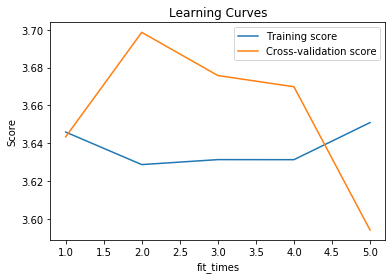

In [55]:
learn_curve(lr_r)

#### final.output.recovery

In [56]:
lr_f = RandomizedSearchCV((LinearRegression()), cv=cv, 
                                  param_distributions={}, n_iter=1, scoring = my_smape, verbose=3, return_train_score = True)

In [57]:
lr_f.fit(features, target_f)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END ................................................ total time=   0.2s
[CV 2/5] END ................................................ total time=   0.3s
[CV 3/5] END ................................................ total time=   0.4s
[CV 4/5] END ................................................ total time=   0.3s
[CV 5/5] END ................................................ total time=   0.2s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=LinearRegression(), n_iter=1,
                   param_distributions={}, return_train_score=True,
                   scoring=make_scorer(smape), verbose=3)

In [58]:
lr_f.best_score_

5.845611610426172

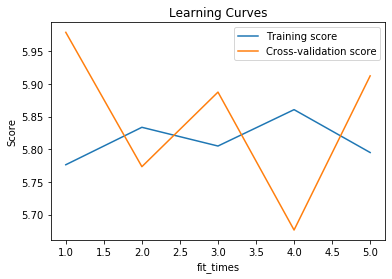

In [59]:
learn_curve(lr_f)

### Модель случайный лес

#### rougher.output.recovery

In [60]:
rf_r = RandomizedSearchCV((RandomForestRegressor(random_state=42, n_estimators=100)), cv=cv, n_iter=1,
                                  param_distributions={},  scoring = my_smape, verbose=3, return_train_score = True)                                 

In [61]:
rf_r.fit(features, target_r)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END ................................................ total time=  49.0s
[CV 2/5] END ................................................ total time=  49.9s
[CV 3/5] END ................................................ total time=  49.6s
[CV 4/5] END ................................................ total time=  49.1s
[CV 5/5] END ................................................ total time=  50.2s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=RandomForestRegressor(random_state=42), n_iter=1,
                   param_distributions={}, return_train_score=True,
                   scoring=make_scorer(smape), verbose=3)

In [62]:
rf_r.best_score_

1.9292062602012905

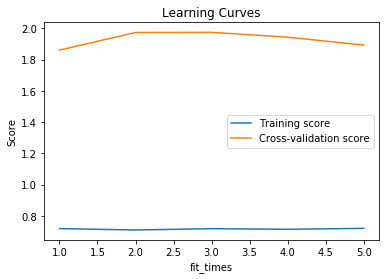

In [63]:
learn_curve(rf_r)

#### final.output.recovery

In [64]:
rf_f = RandomizedSearchCV((RandomForestRegressor(random_state=42, n_estimators=100)), cv=cv, n_iter=1,
                                  param_distributions={}, scoring = my_smape, verbose=3, return_train_score = True)

In [65]:
rf_f.fit(features, target_f)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END ................................................ total time=  53.9s
[CV 2/5] END ................................................ total time=  52.8s
[CV 3/5] END ................................................ total time=  53.1s
[CV 4/5] END ................................................ total time=  52.9s
[CV 5/5] END ................................................ total time=  53.6s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=RandomForestRegressor(random_state=42), n_iter=1,
                   param_distributions={}, return_train_score=True,
                   scoring=make_scorer(smape), verbose=3)

In [66]:
rf_f.best_score_

4.077711733983747

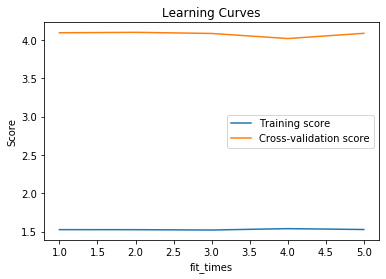

In [67]:
learn_curve(rf_f)

### Модель градиентный бустинг

#### rougher.output.recovery

In [68]:
gb_r = RandomizedSearchCV((GradientBoostingRegressor(random_state=42)), cv=cv, 
                                  param_distributions={}, n_iter=1, scoring = my_smape, verbose=3, return_train_score = True)

In [69]:
gb_r.fit(features, target_r)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END ................................................ total time=  20.6s
[CV 2/5] END ................................................ total time=  20.7s
[CV 3/5] END ................................................ total time=  20.5s
[CV 4/5] END ................................................ total time=  20.5s
[CV 5/5] END ................................................ total time=  20.6s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=GradientBoostingRegressor(random_state=42),
                   n_iter=1, param_distributions={}, return_train_score=True,
                   scoring=make_scorer(smape), verbose=3)

In [70]:
gb_r.best_score_

2.757717122150681

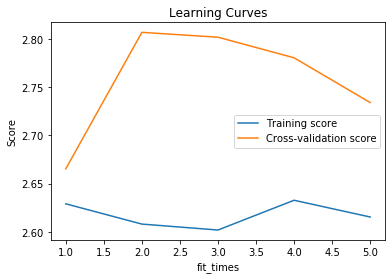

In [71]:
learn_curve(gb_r)

#### final.output.recovery

In [72]:
gb_f = RandomizedSearchCV((GradientBoostingRegressor(random_state=42)), cv=cv, 
                                  param_distributions={}, n_iter=1, scoring = my_smape, verbose=3, return_train_score = True)

In [73]:
gb_f.fit(features, target_f)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV 1/5] END ................................................ total time=  20.9s
[CV 2/5] END ................................................ total time=  20.8s
[CV 3/5] END ................................................ total time=  20.7s
[CV 4/5] END ................................................ total time=  20.6s
[CV 5/5] END ................................................ total time=  20.8s


RandomizedSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
                   estimator=GradientBoostingRegressor(random_state=42),
                   n_iter=1, param_distributions={}, return_train_score=True,
                   scoring=make_scorer(smape), verbose=3)

In [74]:
gb_f.best_score_

5.035172833814481

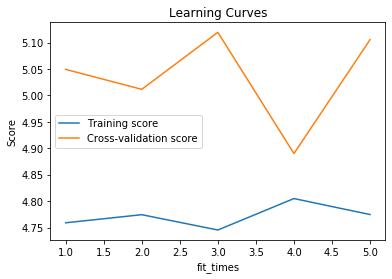

In [75]:
learn_curve(gb_f)

## Тестовая выборка

In [76]:
pred_test_rf_r = rf_r.predict(features_test)
smape(target_test_r, pred_test_rf_r)

3.6837755835717294

In [77]:
pred_test_rf_f = rf_f.predict(features_test)
smape(target_test_f, pred_test_rf_f)

7.775617092208377

- по результатам тестовой выборки, заметно, переобучение модели. Оставляю как есть.

### Total sMape

In [78]:
tsm = tsmape(target_test_r, pred_test_rf_r, target_test_f, pred_test_rf_f)
print('Итоговый Total sMape равен - {:.2f}'.format(tsm))

Итоговый Total sMape равен - 6.75


# <a name="4">Итоговый вывод:</a>  
- На предобработке выправили формат даты, пропуски заполнили imputer от sklern.
- Проанализировали данные, заметили при росте остальных металлом, падение процента обогащения серебра с каждым этапом, возможно это связано с технологическим процессом.
- Провели сравнение распределения средних гранул сырья 2 выборок(обучащей и тестовой), ttest и U-тест Манна-Уитни показали отклонения. Выправить не получилось.
- Нашли выбросы суммарных значений веществ на каждом этапе очистки, и удали их. 
- Удалили выбросы на таргете.
- Выбрали 3 модели для прогнозирования(Линейную регрессию, Случайный лес и Градиентный бустинг). Я не стал в этот проект добавлять гиперпараметры, так как они не слабо меняют итоговую оценку. Лучшие результаты на базовых показателях показал Случайный лес. Но на тесте он оказался переобученным.
- Написали функцию для расчет tSmape.
- Довели tSmape до 6.75/Линейная регрессия даёт 6.40, не знаю правда хорошо это или плохо.